# **Earthquake Damage Prediction**

**Domain Analysis - Earthquake damage prediction**

    Gorkha Earthquake (2015)
The Gorkha earthquake, also known as the Nepal earthquake, struck Nepal on April 25, 2015, with a magnitude of 7.8.  Its epicenter was east of Gorkha District at Barpak, Gorkha, roughly 85 km (53 mi) northwest of central Kathmandu. This devastating earthquake claimed the lives of 9,000 people and left 22,309 others injured.

 The objective of building a prediction model is to anticipate the level of damage to buildings and infrastructure caused by Gorkha earthquake. 


The data was collected through surveys by Kathmandu Living Labs and the Central Bureau of Statistics, which works under the National Planning Commission Secretariat of Nepal. This survey is one of the largest post-disaster datasets ever collected, containing valuable information on earthquake impacts, household conditions, and socio-economic-demographic statistics.

There are 39 columns in this dataset, 

- geo_level_1_id, geo_level_2_id, geo_level_3_id (type: int): geographic region in which building exists, from largest (level 1) to most specific sub-region (level  3). Possible values: level 1: 0-30, level 2: 0-1427, level 3: 0-12567. 
-	count_floors_pre_eq (type: int): number of floors in the building before the earthquake. 
-	age (type: int): age of the building in years. 
-	area_percentage (type: int): normalized area of the building footprint. 
-	height_percentage (type: int): normalized height of the building footprint. 
-	land_surface_condition (type: categorical): surface condition of the land where the building was built. Possible values: n, o, t. 
-	foundation_type (type: categorical): type of foundation used while building. Possible values: h, i, r, u, w. 
-	roof_type (type: categorical): type of roof used while building. Possible values: n, q, x. 
-	ground_floor_type (type: categorical): type of the ground floor. Possible values: f, m, v, x, z. 
-	other_floor_type (type: categorical): type of constructions used in higher than the ground floors (except of roof). Possible values: j, q, s, x. 
-	position (type: categorical): position of the building. Possible values: j, o, s, t. 
-	plan_configuration (type: categorical): building plan configuration. Possible values: a, c, d, f, m, n, o, q, s, u. 
-	has_superstructure_adobe_mud (type: binary): flag variable that indicates if the superstructure was made of Adobe/Mud. 
-	has_superstructure_mud_mortar_stone (type: binary): flag variable that indicates if the superstructure was made of Mud Mortar - Stone. 
-	has_superstructure_stone_flag (type: binary): flag variable that indicates if the superstructure was made of Stone. 
-	has_superstructure_cement_mortar_stone (type: binary): flag variable that indicates if the superstructure was made of Cement Mortar - Stone. 
-	has_superstructure_mud_mortar_brick (type: binary): flag variable that indicates if the superstructure was made of Mud Mortar - Brick. 
-	has_superstructure_cement_mortar_brick (type: binary): flag variable that indicates if the superstructure was made of Cement Mortar - Brick. 
-	has_superstructure_timber (type: binary): flag variable that indicates if the superstructure was made of Timber. 
-	has_superstructure_bamboo (type: binary): flag variable that indicates if the superstructure was made of Bamboo. 
-	has_superstructure_rc_non_engineered (type: binary): flag variable that indicates if the superstructure was made of non-engineered reinforced concrete. 
-	has_superstructure_rc_engineered (type: binary): flag variable that indicates if the superstructure was made of engineered reinforced concrete. 
-	has_superstructure_other (type: binary): flag variable that indicates if the superstructure was made of any other material. 
-	legal_ownership_status (type: categorical): legal ownership status of the land where building was built. Possible values: a, r, v, w. 
-	count_families (type: int): number of families that live in the building. 
-	has_secondary_use (type: binary): flag variable that indicates if the building was used for any secondary purpose. 
-	has_secondary_use_agriculture (type: binary): flag variable that indicates if the building was used for agricultural purposes. 
-	has_secondary_use_hotel (type: binary): flag variable that indicates if the building was used as a hotel. 
-	has_secondary_use_rental (type: binary): flag variable that indicates if the building was used for rental purposes. 
-	has_secondary_use_institution (type: binary): flag variable that indicates if the building was used as a location of any institution. 
-	has_secondary_use_school (type: binary): flag variable that indicates if the building was used as a school. 
-	has_secondary_use_industry (type: binary): flag variable that indicates if the building was used for industrial purposes. 
-	has_secondary_use_health_post (type: binary): flag variable that indicates if the building was used as a health post. 
-	has_secondary_use_gov_office (type: binary): flag variable that indicates if the building was used fas a government office. 
-	has_secondary_use_use_police (type: binary): flag variable that indicates if the building was used as a police station. 
-	has_secondary_use_other (type: binary): flag variable that indicates if the building was secondarily used for other purposes. 



In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

# Read Data

In [2]:
df1 = pd.read_csv("C:/Users/Ashwi/OneDrive/Documents/Datamites/Assignment/Earthquake/dataset/train_labels.csv")
df2 = pd.read_csv("C:/Users/Ashwi/OneDrive/Documents/Datamites/Assignment/Earthquake/dataset/train_values.csv")

In [3]:
pd.set_option('display.max_columns',None)
df1.head()

,building_id,damage_grade
0,802906,3
1,28830,2
2,94947,3
3,590882,2
4,201944,3


In [5]:
df2.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
0,802906,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
1,28830,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
2,94947,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
3,590882,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
4,201944,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0


In [6]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260601 entries, 0 to 260600
Data columns (total 39 columns):
 #   Column                                  Non-Null Count   Dtype 
---  ------                                  --------------   ----- 
 0   building_id                             260601 non-null  int64 
 1   geo_level_1_id                          260601 non-null  int64 
 2   geo_level_2_id                          260601 non-null  int64 
 3   geo_level_3_id                          260601 non-null  int64 
 4   count_floors_pre_eq                     260601 non-null  int64 
 5   age                                     260601 non-null  int64 
 6   area_percentage                         260601 non-null  int64 
 7   height_percentage                       260601 non-null  int64 
 8   land_surface_condition                  260601 non-null  object
 9   foundation_type                         260601 non-null  object
 10  roof_type                               260601 non-null 

In [7]:
df2.describe()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
count,2.606010e+05,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000
mean,5.256755e+05,13.900353,701.074685,6257.876148,2.129723,26.535029,8.018051,5.434365,0.088645,0.761935,0.034332,0.018235,0.068154,0.075268,0.254988,0.085011,0.042590,0.015859,0.014985,0.983949,0.111880,0.064378,0.033626,0.008101,0.000940,0.000361,0.001071,0.000188,0.000146,0.000088,0.005119
std,3.045450e+05,8.033617,412.710734,3646.369645,0.727665,73.565937,4.392231,1.918418,0.284231,0.425900,0.182081,0.133800,0.252010,0.263824,0.435855,0.278899,0.201931,0.124932,0.121491,0.418389,0.315219,0.245426,0.180265,0.089638,0.030647,0.018989,0.032703,0.013711,0.012075,0.009394,0.071364
min,4.000000e+00,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.611900e+05,7.000000,350.000000,3073.000000,2.000000,10.000000,5.000000,4.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.257570e+05,12.000000,702.000000,6270.000000,2.000000,15.000000,7.000000,5.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,7.897620e+05,21.000000,1050.000000,9412.000000,2.000000,30.000000,9.000000,6.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.052934e+06,30.000000,1427.000000,12567.000000,9.000000,995.000000,100.000000,32.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,9.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [4]:
df1.shape

(260601, 2)

In [5]:
df2.shape

(260601, 39)

In [4]:
df=pd.merge(df2,df1,on="building_id",how="inner")

In [11]:
df.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,802906,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,28830,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,94947,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,590882,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,201944,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3


In [12]:
df.describe(include='O')

,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,legal_ownership_status
count,260601,260601,260601,260601,260601,260601,260601,260601
unique,3,5,3,5,4,4,10,4
top,t,r,n,f,q,s,d,v
freq,216757,219196,182842,209619,165282,202090,250072,250939


# Exploratory Data Analysis (EDA)

There are some categorical columns present in the data

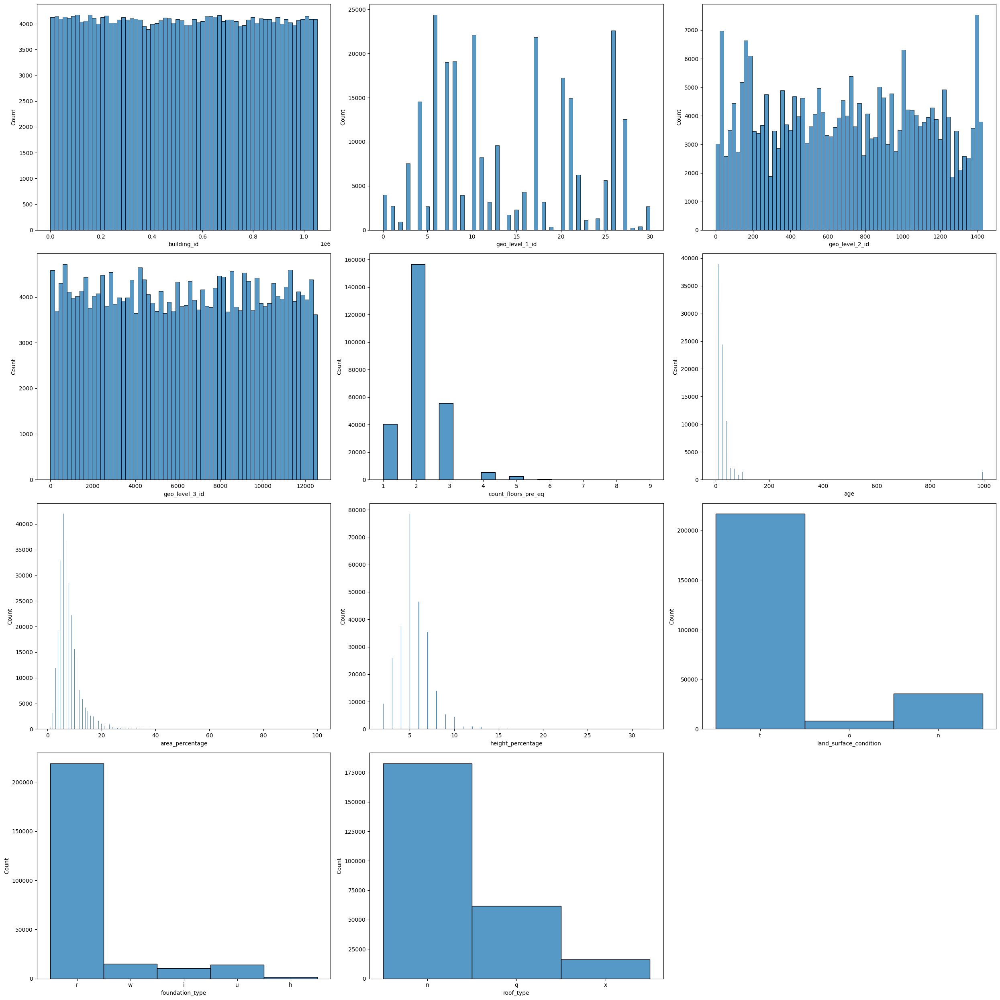

In [13]:
box = df.iloc[:,:-1]

plt.figure(figsize=(25,25),facecolor='white')
plotnum=1
for c in box:
    if(plotnum<12):
        ax=plt.subplot(4,3,plotnum)
        sns.histplot(box[c])
    plotnum+=1
plt.tight_layout()

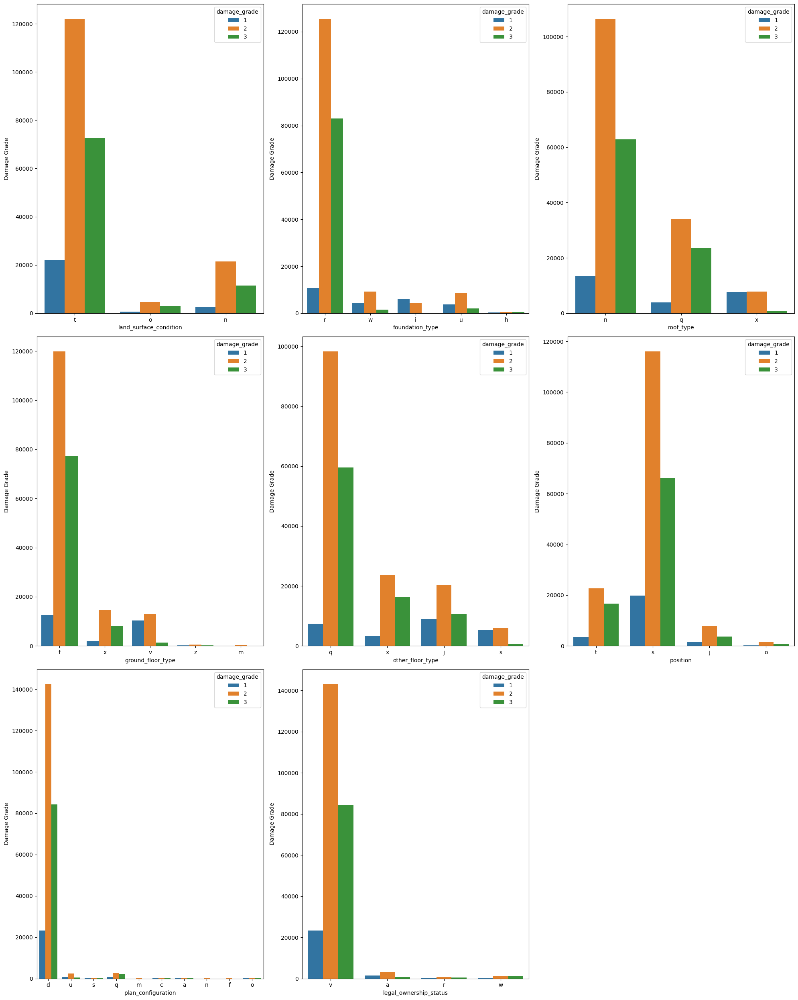

In [14]:
categorical_data = ['land_surface_condition', 'foundation_type', 'roof_type', 'ground_floor_type', 
                    'other_floor_type', 'position', 'plan_configuration', 'legal_ownership_status']

plt.figure(figsize=(20, 25))
for i, category in enumerate(categorical_data, start=1):
    plt.subplot(3, 3, i)
    sns.countplot(x=category, data=df, hue='damage_grade')
    plt.xlabel(category)
    plt.ylabel('Damage Grade')

plt.tight_layout()
plt.show()


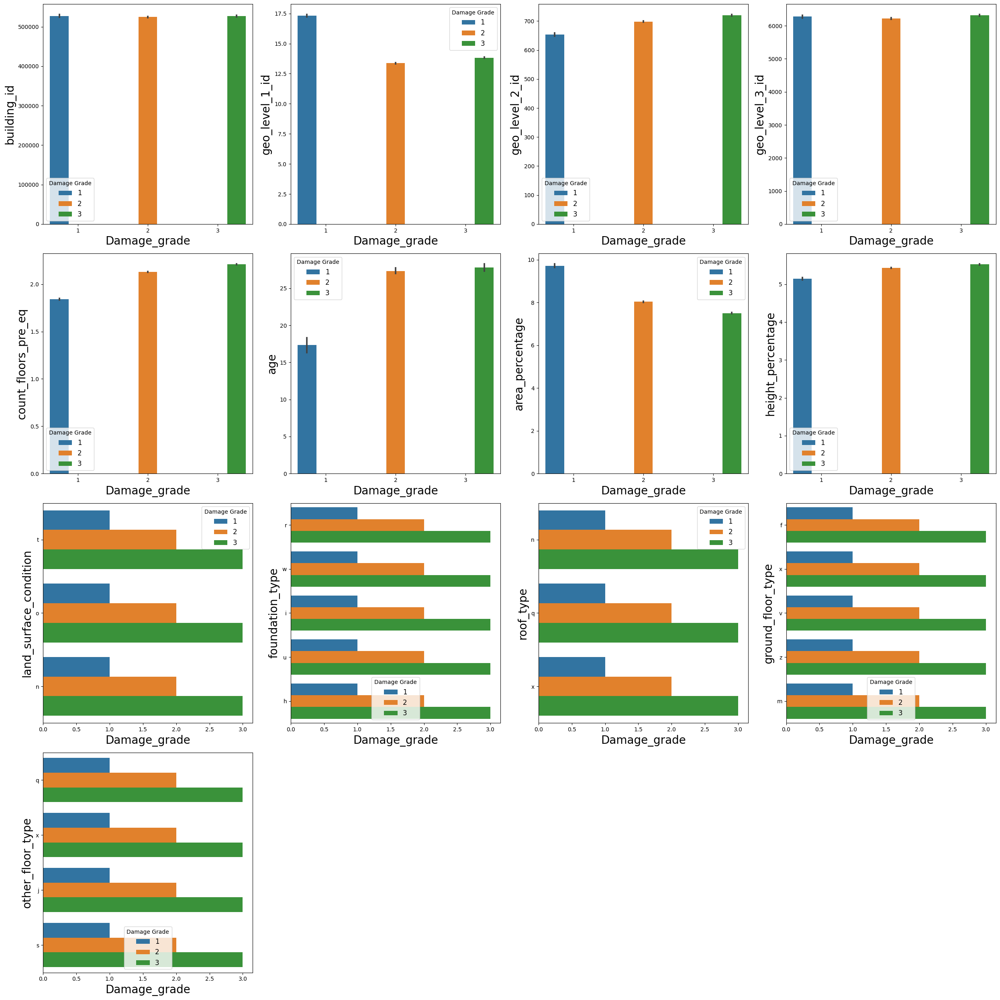

In [15]:
plt.figure(figsize=(25,25), facecolor='white')
plotnum = 1
for c in df:
    if(plotnum < 14):
        ax = plt.subplot(4, 4, plotnum)
        sns.barplot(x='damage_grade', y=c, hue='damage_grade', data=df)
        plt.xlabel('Damage_grade', fontsize=20)
        plt.ylabel(c, fontsize=20)
        plt.legend(title='Damage Grade', fontsize='large')
    plotnum += 1
plt.tight_layout()

In [16]:
from ydata_profiling import ProfileReport
ydata_report=ProfileReport(df)
ydata_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [17]:
df.isnull().sum()

building_id                               0
geo_level_1_id                            0
geo_level_2_id                            0
geo_level_3_id                            0
count_floors_pre_eq                       0
age                                       0
area_percentage                           0
height_percentage                         0
land_surface_condition                    0
foundation_type                           0
roof_type                                 0
ground_floor_type                         0
other_floor_type                          0
position                                  0
plan_configuration                        0
has_superstructure_adobe_mud              0
has_superstructure_mud_mortar_stone       0
has_superstructure_stone_flag             0
has_superstructure_cement_mortar_stone    0
has_superstructure_mud_mortar_brick       0
has_superstructure_cement_mortar_brick    0
has_superstructure_timber                 0
has_superstructure_bamboo       

# One hot Encoding

Converting columns (land_surface_condition, foundation_type,roof_type, ground_floor_type, other_floor_type, position, plan_configuration, legal_ownership_status) which has categorical values to numerical values

In [5]:
new_df = pd.get_dummies(df, drop_first=True)
new_df = new_df.astype(int)

In [8]:
new_df.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade,land_surface_condition_o,land_surface_condition_t,foundation_type_i,foundation_type_r,foundation_type_u,foundation_type_w,roof_type_q,roof_type_x,ground_floor_type_m,ground_floor_type_v,ground_floor_type_x,ground_floor_type_z,other_floor_type_q,other_floor_type_s,other_floor_type_x,position_o,position_s,position_t,plan_configuration_c,plan_configuration_d,plan_configuration_f,plan_configuration_m,plan_configuration_n,plan_configuration_o,plan_configuration_q,plan_configuration_s,plan_configuration_u,legal_ownership_status_r,legal_ownership_status_v,legal_ownership_status_w
0,802906,6,487,12198,2,30,6,5,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
1,28830,8,900,2812,2,10,8,7,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
2,94947,21,363,8973,2,10,5,5,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
3,590882,22,418,10694,2,10,6,5,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
4,201944,11,131,1488,3,30,8,9,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0


In [6]:
new_df=new_df.drop('building_id',axis=1)

In [126]:
new_df.head()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade,land_surface_condition_o,land_surface_condition_t,foundation_type_i,foundation_type_r,foundation_type_u,foundation_type_w,roof_type_q,roof_type_x,ground_floor_type_m,ground_floor_type_v,ground_floor_type_x,ground_floor_type_z,other_floor_type_q,other_floor_type_s,other_floor_type_x,position_o,position_s,position_t,plan_configuration_c,plan_configuration_d,plan_configuration_f,plan_configuration_m,plan_configuration_n,plan_configuration_o,plan_configuration_q,plan_configuration_s,plan_configuration_u,legal_ownership_status_r,legal_ownership_status_v,legal_ownership_status_w
0,6,487,12198,2,30,6,5,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
1,8,900,2812,2,10,8,7,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
2,21,363,8973,2,10,5,5,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
3,22,418,10694,2,10,6,5,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
4,11,131,1488,3,30,8,9,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0


# Data Preprocessing

CHecking for outliers

In [121]:
Columns=new_df[['age','area_percentage','height_percentage']]

In [122]:
Columns.describe()

,age,area_percentage,height_percentage
count,260601.000000,260601.000000,260601.000000
mean,21.307881,8.018051,5.434365
std,19.559913,4.392231,1.918418
min,0.000000,1.000000,2.000000
25%,10.000000,5.000000,4.000000
50%,15.000000,7.000000,5.000000
75%,30.000000,9.000000,6.000000
max,200.000000,100.000000,32.000000


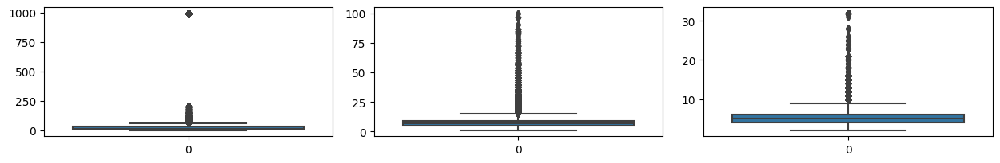

In [22]:
plt.figure(figsize=(25,20),facecolor='white')

plotnumber=1

for column in Columns:
    if plotnumber<=3 :
        ax=plt.subplot(10,6,plotnumber)
        sns.boxplot(new_df[column])
       
    plotnumber+=1
plt.tight_layout()   

In [7]:
# Replace the outlier value of 995 in the 'age' column 
new_df.loc[new_df['age'] == 995, 'age'] = new_df['age'].median()


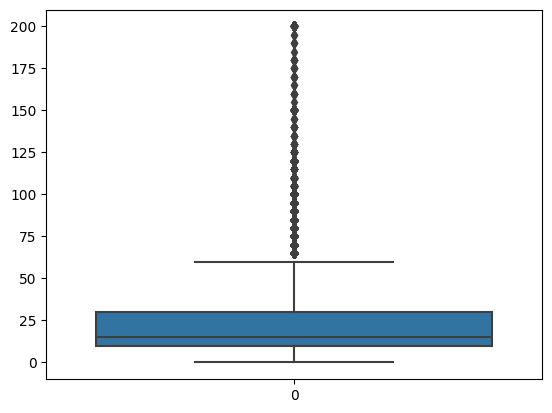

In [24]:
sns.boxplot(new_df.age)
plt.show()

Checking for duplicates

In [25]:
# Check for duplicates
duplicate_rows = new_df.duplicated()

# Count the number of duplicate rows
num_duplicates = duplicate_rows.sum()
print("Number of duplicate rows:", num_duplicates)

Number of duplicate rows: 0


Checking for correlation

In [128]:
new_df.corr()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade,land_surface_condition_o,land_surface_condition_t,foundation_type_i,foundation_type_r,foundation_type_u,foundation_type_w,roof_type_q,roof_type_x,ground_floor_type_m,ground_floor_type_v,ground_floor_type_x,ground_floor_type_z,other_floor_type_q,other_floor_type_s,other_floor_type_x,position_o,position_s,position_t,plan_configuration_c,plan_configuration_d,plan_configuration_f,plan_configuration_m,plan_configuration_n,plan_configuration_o,plan_configuration_q,plan_configuration_s,plan_configuration_u,legal_ownership_status_r,legal_ownership_status_v,legal_ownership_status_w
geo_level_1_id,1.000000,-0.061405,0.002718,-0.089364,-0.043786,0.071158,-0.063474,-0.018245,-0.152038,0.007677,0.023656,-0.028854,0.134121,0.144985,0.074169,0.016454,0.015767,0.022670,0.035108,-0.010428,-0.019786,0.001911,0.023523,0.003700,0.002977,0.002655,-0.002303,0.001060,0.000523,-0.017992,-0.072347,-0.008616,0.030337,0.003362,-0.188061,0.077189,0.212048,0.002146,0.048272,0.009872,0.110563,-0.009462,-0.001048,-0.130033,0.020317,0.047570,-0.002604,0.024287,-0.023791,0.004566,-0.030270,0.001674,0.004048,0.000822,0.008179,0.009383,0.008559,0.033052,0.007874,-0.082055,0.004646
geo_level_2_id,-0.061405,1.000000,0.000921,0.047730,0.027284,-0.049443,0.035516,0.015833,0.076491,-0.008743,-0.009122,0.014246,-0.079875,-0.023927,-0.032588,-0.038173,-0.036074,-0.020144,-0.012439,-0.001519,0.017522,-0.008439,-0.030704,-0.004840,-0.004856,0.000687,-0.000757,-0.000152,0.001926,-0.013068,0.043161,0.005193,-0.033191,-0.044893,0.097980,-0.062514,-0.042831,-0.051035,-0.067152,0.003788,-0.078279,-0.055428,-0.006407,0.070900,-0.050574,-0.023676,0.004049,-0.005419,0.008971,-0.006873,0.022083,0.000590,-0.007971,0.000415,-0.005786,-0.004326,-0.005928,-0.025532,-0.027011,0.023189,0.013579
geo_level_3_id,0.002718,0.000921,1.000000,-0.021646,-0.006113,-0.005643,-0.024507,-0.015732,0.026294,0.019579,0.005966,-0.023278,-0.005116,-0.003916,0.006143,0.002265,-0.012420,-0.010604,-0.002479,0.007375,0.015995,-0.002001,-0.007356,-0.007058,-0.004373,-0.000862,-0.002632,-0.000943,0.000269,-0.002463,0.007932,0.014912,-0.018025,-0.010494,0.001456,-0.007069,0.010621,0.006104,-0.014635,-0.002068,-0.004325,-0.006870,-0.002622,0.000706,-0.012337,-0.002812,-0.019633,0.017344,-0.005199,0.003044,-0.001975,-0.001072,-0.005090,0.003123,-0.002804,0.001895,-0.003399,0.003240,-0.001309,-0.018533,-0.013100
count_floors_pre_eq,-0.089364,0.047730,-0.021646,1.000000,0.297512,0.101071,0.772734,0.174852,-0.027116,-0.041058,-0.011329,0.257279,-0.085821,-0.056637,-0.070487,0.007448,0.049000,-0.029888,0.086586,0.052125,-0.005294,0.077120,0.035425,0.016384,0.008833,-0.002611,0.006786,0.009639,0.003939,-0.002073,0.122308,-0.023156,0.046218,0.040634,0.131692,-0.095874,-0.133956,0.085249,0.038167,-0.004770,-0.070247,0.001164,-0.037901,0.353823,0.172380,0.081222,0.219764,-0.229465,0.056249,0.017159,0.025091,0.003528,0.015891,0.002651,0.001148,-0.033170,-0.003314,-0.004863,-0.008236,0.073273,0.007046
age,-0.043786,0.027284,-0.006113,0.297512,1.000000,-0.027809,0.203922,0.207995,0.014941,0.012922,-0.040805,0.270670,-0.121914,-0.033807,-0.049306,-0.082129,-0.092955,-0.007569,0.045099,-0.032128,0.004662,-0.044365,-0.022840,-0.013830,-0.008141,-0.005009,-0.00

In [8]:
import os

Load and save cleaned data

In [9]:
folder_path = os.path.join("C:/Users/Ashwi/OneDrive/Documents/Datamites/Assignment/Earthquake","Cleaned_data.csv")
new_df.to_csv(folder_path, index=False)

In [10]:
data = pd.read_csv("C:/Users/Ashwi/OneDrive/Documents/Datamites/Assignment/Earthquake\Cleaned_data.csv")

In [11]:
data.damage_grade

0         3
1         2
2         3
3         2
4         3
         ..
260596    2
260597    3
260598    3
260599    2
260600    3
Name: damage_grade, Length: 260601, dtype: int64

In [11]:
x=data.drop(columns=['damage_grade'])
y=data['damage_grade']

In [13]:
x

,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,land_surface_condition_o,land_surface_condition_t,foundation_type_i,foundation_type_r,foundation_type_u,foundation_type_w,roof_type_q,roof_type_x,ground_floor_type_m,ground_floor_type_v,ground_floor_type_x,ground_floor_type_z,other_floor_type_q,other_floor_type_s,other_floor_type_x,position_o,position_s,position_t,plan_configuration_c,plan_configuration_d,plan_configuration_f,plan_configuration_m,plan_configuration_n,plan_configuration_o,plan_configuration_q,plan_configuration_s,plan_configuration_u,legal_ownership_status_r,legal_ownership_status_v,legal_ownership_status_w
0,6,487,12198,2,30,6,5,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
1,8,900,2812,2,10,8,7,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
2,21,363,8973,2,10,5,5,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0
3,22,418,10694,2,10,6,5,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
4,11,131,1488,3,30,8,9,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260596,25,1335,1621,1,55,6,3,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0
260597,17,715,2060,2,0,6,5,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
260598,17,51,8163,3,55,6,7,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0
260599,26,39,1851,2,10,14,6,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


In [14]:
y

0         3
1         2
2         3
3         2
4         3
         ..
260596    2
260597    3
260598    3
260599    2
260600    3
Name: damage_grade, Length: 260601, dtype: int64

In [12]:
y.value_counts()

damage_grade
2    148259
3     87218
1     25124
Name: count, dtype: int64

Balancing the data

In [13]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
x_sm , y_sm = smote.fit_resample(x, y)

In [14]:
y_sm.value_counts()

damage_grade
3    148259
2    148259
1    148259
Name: count, dtype: int64

Data Scaling

     Using MinMaxScaler

In [15]:
from sklearn.preprocessing import MinMaxScaler

In [16]:
scale=MinMaxScaler()
scaled_data=scale.fit_transform(x_sm)

In [17]:
scaled_data

array([[0.2       , 0.3412754 , 0.97063738, ..., 0.        , 1.        ,
        0.        ],
       [0.26666667, 0.63069376, 0.22376064, ..., 0.        , 1.        ,
        0.        ],
       [0.7       , 0.25437982, 0.71401289, ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.26666667, 0.99159075, 0.15103048, ..., 0.        , 1.        ,
        0.        ],
       [0.53333333, 0.67203924, 0.60213257, ..., 0.        , 1.        ,
        0.        ],
       [0.33333333, 0.24947442, 0.56290284, ..., 0.        , 1.        ,
        0.        ]])

Splitting the data for training and testing

In [18]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(scaled_data,y_sm,test_size=0.3,random_state=33)

Logistic Regression

In [22]:
from sklearn.linear_model import LogisticRegression
# initialized Logistic regression
lr = LogisticRegression()

# fit the Model
lr.fit(x_train, y_train)

# Prediction for test
lr_test_pred = lr.predict(x_test)

# prediction for train
lr_train_pred = lr.predict(x_train)


In [23]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# test accuracy 
lr_test_acc = accuracy_score(y_test, lr_test_pred)
print("Test accuracy", lr_test_acc)

# training accuracy 
lr_train_acc = accuracy_score(y_train, lr_train_pred)
print("Train accuracy", lr_train_acc)

Test accuracy 0.628970127553697
Train accuracy 0.6276999964669191


Support Vector Classifier

In [50]:
from sklearn.svm import SVC

In [44]:
# Define the subsample size (e.g., 50% of the training data)
subsample_size = 0.5
subsample_x_train, _, subsample_y_train, _ = train_test_split(x_train, y_train, train_size=subsample_size, random_state=42)

# Initialize and train your SVM model on the subsample
svc = SVC()
svc.fit(subsample_x_train, subsample_y_train)

SVC()

In [45]:
# prediction for test
svc_test_pred = svc.predict(x_test)

# predition for test
svc_train_pred = svc.predict(x_train)

In [46]:
# test accuracy 
svc_test_acc = accuracy_score(y_test, svc_test_pred)
print("Test accuracy", svc_test_acc)

# training accuracy 
svc_train_acc = accuracy_score(y_train, svc_train_pred)
print("Train accuracy", svc_train_acc)

Test accuracy 0.7084491209137102
Train accuracy 0.7104609960969117


K Nearest Classifier

In [24]:
from sklearn.neighbors import KNeighborsClassifier
x_train,x_test,y_train,y_test=train_test_split(scaled_data,y_sm,test_size=0.3,random_state=33)

In [25]:
# intialized model
knn = KNeighborsClassifier()

# fit the model
knn.fit(x_train, y_train)

# Predict for test
knn_test_pred = knn.predict(x_test)

# prediction for train 
knn_train_pred = knn.predict(x_train)

In [26]:
Knn_test_accuracy=accuracy_score(y_test,knn_test_pred)
print("Test accuracy is",Knn_test_accuracy)

knn_train_accuracy=accuracy_score(y_train,knn_train_pred)
print("Train accuracy score is",knn_train_accuracy)

Test accuracy is 0.7497339508670954
Train accuracy score is 0.8250450467812027


In [154]:
# confusion matrix 
print(classification_report(y_test, knn_test_pred))

              precision    recall  f1-score   support

           1       0.83      0.91      0.87     37272
           2       0.69      0.64      0.66     37124
           3       0.73      0.72      0.72     36799

    accuracy                           0.76    111195
   macro avg       0.75      0.76      0.75    111195
weighted avg       0.75      0.76      0.75    111195



Gaussian Naive Bayes

In [19]:
from sklearn.naive_bayes import GaussianNB

In [156]:
gnb=GaussianNB()
gnb.fit(x_train,y_train)
gnb_test_predict=gnb.predict(x_test)
gnb_train_predict=gnb.predict(x_train)

In [157]:
gnb_test_accuracy=accuracy_score(y_test,gnb_test_predict)
print("Test score accuracy is ",gnb_test_accuracy)

gnb_train_accuracy=accuracy_score(y_train,gnb_train_predict)
print("Train predict accuracy is ",gnb_train_accuracy)

Test score accuracy is  0.5609065155807366
Train predict accuracy is  0.5599222979657176


In [158]:
# confusion matrix 
print(classification_report(y_test, gnb_test_predict))

              precision    recall  f1-score   support

           1       0.76      0.68      0.71     37272
           2       0.61      0.10      0.17     37124
           3       0.47      0.91      0.62     36799

    accuracy                           0.56    111195
   macro avg       0.61      0.56      0.50    111195
weighted avg       0.61      0.56      0.50    111195



Random Forest Classifier

In [159]:
from sklearn.ensemble import RandomForestClassifier

In [184]:
rc=RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=300)
rc.fit(x_train,y_train)
rc_test_predict=rc.predict(x_test)
rc_train_predict=rc.predict(x_train)

In [185]:
rc_test_accuracy=accuracy_score(y_test,rc_test_predict)
print("Test accuracy score is ", rc_test_accuracy)

rc_train_accuracy=accuracy_score(y_train,rc_train_predict)
print("Train accuracy score is ",rc_train_accuracy)

Test accuracy score is  0.8169971671388102
Train accuracy score is  0.9907548968469522


In [186]:
# confusion matrix 
print(classification_report(y_test, rc_test_predict))

              precision    recall  f1-score   support

           1       0.91      0.93      0.92     37272
           2       0.75      0.74      0.75     37124
           3       0.79      0.78      0.78     36799

    accuracy                           0.82    111195
   macro avg       0.82      0.82      0.82    111195
weighted avg       0.82      0.82      0.82    111195



Xgb Classifier

In [163]:
from xgboost import XGBClassifier

In [41]:
np.unique(y_train)

array([1, 2, 3], dtype=int64)

In [166]:
# for y_train
y_train_binary = np.where(y_train==1,0,1)

# for y_test
y_test_binary = np.where(y_test==1,0,1)

In [167]:
# initialized model
xgb_clf = XGBClassifier(n_estimators=200, max_depth=5, learning_rate=0.5, subsample=0.8,
                        gamma=0.1, reg_lambda=1.0, reg_alpha=0.1)

# fit the model
xgb_clf.fit(x_train, y_train_binary)

# prediction for test
xgb_test_pred = xgb_clf.predict(x_test)

# prediction for train
xgb_train_pred = xgb_clf.predict(x_train)

In [168]:
# test accuracy 
xgb_test_acc = accuracy_score(y_test_binary, xgb_test_pred)
print("Test accuracy", xgb_test_acc)

# training accuracy 
xgb_train_acc = accuracy_score(y_train_binary, xgb_train_pred)
print("Train accuracy", xgb_train_acc)

Test accuracy 0.9302216826296147
Train accuracy 0.9355840542954955


In [169]:
# confusion matrix 
print(classification_report(y_test_binary, xgb_test_pred))

              precision    recall  f1-score   support

           0       0.90      0.89      0.90     37272
           1       0.95      0.95      0.95     73923

    accuracy                           0.93    111195
   macro avg       0.92      0.92      0.92    111195
weighted avg       0.93      0.93      0.93    111195



In [182]:
# Adjust the class labels to start from 0
y_train_adjusted = y_train - 1
y_test_adjusted = y_test - 1

# Initialize model
xgb_clf = XGBClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=300)
# Fit the model
xgb_clf.fit(x_train, y_train_adjusted)

# Prediction for test
xgb_test_pred = xgb_clf.predict(x_test)

# Prediction for train
xgb_train_pred = xgb_clf.predict(x_train)

# Test accuracy 
xgb_test_acc = accuracy_score(y_test_adjusted, xgb_test_pred)
print("Test accuracy:", xgb_test_acc)

# Training accuracy 
xgb_train_acc = accuracy_score(y_train_adjusted, xgb_train_pred)
print("Train accuracy:", xgb_train_acc)



Test accuracy: 0.813696659022438
Train accuracy: 0.8362381663279194


In [175]:
pd.crosstab(y_test_adjusted,xgb_test_pred)

col_0,0,1,2
damage_grade,,,
0,33484,2855,933
1,2597,28457,6070
2,1359,7779,27661


In [183]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

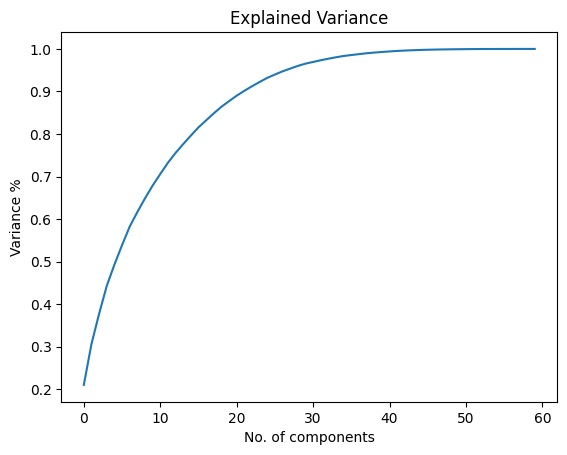

In [187]:
pca = PCA()
pca_1 = pca.fit_transform(x_train)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("No. of components")
plt.ylabel("Variance %")
plt.title("Explained Variance")
plt.show()


In [188]:
from sklearn.decomposition import PCA

# Initialize PCA with desired number of components
pca = PCA(n_components=0.95)  # You can also specify the number of components directly

# Fit PCA to the training data and transform it
x_train_pca = pca.fit_transform(x_train)

# Transform the test data using the fitted PCA
x_test_pca = pca.transform(x_test)

# Now, use the transformed data (x_train_pca, x_test_pca) for model training and evaluation


In [189]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Initialize and train your RandomForestClassifier
rc = RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=300)
rc.fit(x_train_pca, y_train)

# Predict on the test data
rc_test_predict = rc.predict(x_test_pca)

# Calculate accuracy on test data
rc_test_accuracy = accuracy_score(y_test, rc_test_predict)
print("Test accuracy score is ", rc_test_accuracy)


Test accuracy score is  0.7924546967039885


In [190]:
from sklearn.naive_bayes import GaussianNB
gnb=GaussianNB()
gnb.fit(x_train_pca,y_train)
gnb_test_predict=gnb.predict(x_test_pca)
gnb_train_predict=gnb.predict(x_train_pca)


In [191]:
gnb_test_accuracy=accuracy_score(y_test,gnb_test_predict)
print("Test score accuracy is ",gnb_test_accuracy)

gnb_train_accuracy=accuracy_score(y_train,gnb_train_predict)
print("Train predict accuracy is ",gnb_train_accuracy)

Test score accuracy is  0.5629299878591664
Train predict accuracy is  0.5613822088721814


In [192]:
from sklearn.neighbors import KNeighborsClassifier
# intialized model
knn = KNeighborsClassifier()

# fit the model
knn.fit(x_train_pca, y_train)

# Predict for test
knn_test_pred = knn.predict(x_test_pca)

# prediction for train 
knn_train_pred = knn.predict(x_train_pca)

In [193]:
Knn_test_accuracy=accuracy_score(y_test,knn_test_pred)
print("Test accuracy is",Knn_test_accuracy)

knn_train_accuracy=accuracy_score(y_train,knn_train_pred)
print("Train accuracy score is",knn_train_accuracy)

Test accuracy is 0.7608075902693466
Train accuracy score is 0.8287347638661559


In [194]:
from sklearn.linear_model import LogisticRegression
# initialized Logistic regression
lr = LogisticRegression()

# fit the Model
lr.fit(x_train_pca, y_train)

# Prediction for test
lr_test_pred = lr.predict(x_test_pca)

# prediction for train
lr_train_pred = lr.predict(x_train_pca)

In [195]:

# test accuracy 
lr_test_acc = accuracy_score(y_test, lr_test_pred)
print("Test accuracy", lr_test_acc)

# training accuracy 
lr_train_acc = accuracy_score(y_train, lr_train_pred)
print("Train accuracy", lr_train_acc)

Test accuracy 0.6174108548046225
Train accuracy 0.6158785545982697


In [196]:
# Define the subsample size (e.g., 50% of the training data)
subsample_size = 0.5
subsample_x_train, _, subsample_y_train, _ = train_test_split(x_train_pca, y_train, train_size=subsample_size, random_state=42)

# Initialize and train your SVM model on the subsample
svc = SVC()
svc.fit(subsample_x_train, subsample_y_train)

SVC()

In [197]:
# prediction for test
svc_test_pred = svc.predict(x_test_pca)

# predition for test
svc_train_pred = svc.predict(x_train_pca)

In [198]:
# test accuracy 
svc_test_acc = accuracy_score(y_test, svc_test_pred)
print("Test accuracy", svc_test_acc)

# training accuracy 
svc_train_acc = accuracy_score(y_train, svc_train_pred)
print("Train accuracy", svc_train_acc)

Test accuracy 0.6624038850667746
Train accuracy 0.6667925727407354


In [110]:
# Adjust the class labels to start from 0
y_train_adjusted = y_train - 1
y_test_adjusted = y_test - 1

# Initialize model
xgb_clf = XGBClassifier(n_estimators=200, max_depth=5, learning_rate=0.5, subsample=0.8,
                        gamma=0.1, reg_lambda=1.0, reg_alpha=0.1)
# Fit the model
xgb_clf.fit(x_train_pca, y_train_adjusted)

# Prediction for test
xgb_test_pred = xgb_clf.predict(x_test_pca)

# Prediction for train
xgb_train_pred = xgb_clf.predict(x_train_pca)

# Test accuracy 
xgb_test_acc = accuracy_score(y_test_adjusted, xgb_test_pred)
print("Test accuracy:", xgb_test_acc)

# Training accuracy 
xgb_train_acc = accuracy_score(y_train_adjusted, xgb_train_pred)
print("Train accuracy:", xgb_train_acc)

Test accuracy: 0.7406058425888454
Train accuracy: 0.7798055520760062


In [80]:
import pandas as pd

# Convert x_train to a DataFrame
x_train_df = pd.DataFrame(x_train)

# Get the indices of the selected features
selected_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_features = x_train_df.columns[selected_indices]

# Print the selected feature names
print("Selected Features:", selected_features)


Selected Features: Index([8, 9, 13, 33, 34, 37, 38, 40, 43, 45], dtype='int64')


In [88]:
# Convert the selected feature indices to a list
selected_feature_indices = list(selected_indices)

# Get the names of the selected features
selected_feature_names = x_train_df.columns[selected_feature_indices]


In [95]:
import pandas as pd
from sklearn.feature_selection import SelectKBest, f_classif

# Convert x_train to a DataFrame
x_train_df = pd.DataFrame(x_train)

# Initialize the SelectKBest feature selector with the ANOVA F-test
selector_anova = SelectKBest(score_func=f_classif, k=10)

# Fit the selector to the training data and transform it
x_train_selected_anova = selector_anova.fit_transform(x_train_df, y_train)

# Get the indices of the selected features
selected_indices_anova = selector_anova.get_support(indices=True)

# Get the names of the selected features
selected_feature_names_anova = x_train_df.columns[selected_indices_anova]

# Print the selected feature names
print("Selected Features (ANOVA F-test):", selected_feature_names_anova)



Selected Features (ANOVA F-test): Index([1, 4, 5, 9, 19, 34, 37, 38, 40, 43], dtype='int64')


In [27]:
selected_feature_indices = [8, 9, 13, 33, 34, 37, 38, 40, 43, 45]
selected_feature_names = [x.columns[i] for i in selected_feature_indices]



In [28]:
x_train_selected = x_train[:, selected_feature_indices]
x_test_selected = x_test[:, selected_feature_indices]


Extreme Gradient Boost works well with this Dataset


In [201]:
# Initialize model with hyperparameters including gamma, lambda, and alpha
xgb_clf = XGBClassifier()

# Fit the model
xgb_clf.fit(x_train_selected, y_train_adjusted)

# Make predictions
xgb_test_pred = xgb_clf.predict(x_test_selected)
xgb_train_pred = xgb_clf.predict(x_train_selected)

# Calculate accuracies
xgb_test_acc = accuracy_score(y_test_adjusted, xgb_test_pred)
xgb_train_acc = accuracy_score(y_train_adjusted, xgb_train_pred)

print("Test accuracy:", xgb_test_acc)
print("Train accuracy:", xgb_train_acc)


Test accuracy: 0.5633077026844733
Train accuracy: 0.5624344239197558


In [202]:
rc=RandomForestClassifier()
rc.fit(x_train_selected,y_train)
rc_test_predict=rc.predict(x_test_selected)
rc_train_predict=rc.predict(x_train_selected)

In [203]:
rc_test_accuracy=accuracy_score(y_test,rc_test_predict)
print("Test accuracy score is ", rc_test_accuracy)

rc_train_accuracy=accuracy_score(y_train,rc_train_predict)
print("Train accuracy score is ",rc_train_accuracy)

Test accuracy score is  0.5633077026844733
Train accuracy score is  0.5624344239197558


In [113]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize Random Forest Classifier
rc = RandomForestClassifier()

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rc, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(x_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Print the best parameters
print("Best Parameters:", best_params)


Fitting 3 folds for each of 81 candidates, totalling 243 fits
Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


In [33]:
from sklearn.ensemble import RandomForestClassifier

rc_best = RandomForestClassifier(max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=300)

# Train the model with the best parameters
rc_best.fit(x_train, y_train)


RandomForestClassifier(n_estimators=300)

In [34]:
# Predict on the test data
y_pred_test = rc_best.predict(x_test)


# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred_test)
print("Test Accuracy:", accuracy)

Test Accuracy: 0.8130761275237196


In [36]:
y_train_test=rc_best.predict(x_train)
rc_train_accuracy=accuracy_score(y_train,y_train_test)
print("Train accuracy score is ",rc_train_accuracy)

Train accuracy score is  0.9912122642872973


In [37]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

# Define the parameter distributions
param_dist = {
    'n_estimators': randint(100, 1000),
    'max_depth': randint(1, 20),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 20),
}

# Initialize Random Forest Classifier
rc = RandomForestClassifier()

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=rc, param_distributions=param_dist, n_iter=100, cv=3, n_jobs=-1, verbose=2, random_state=42)

# Fit the randomized search to the data
random_search.fit(x_train, y_train)

# Get the best parameters
best_params_random = random_search.best_params_

# Print the best parameters
print("Best Parameters (Randomized Search):", best_params_random)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best Parameters (Randomized Search): {'max_depth': 19, 'min_samples_leaf': 5, 'min_samples_split': 10, 'n_estimators': 740}


In [38]:
# Initialize Random Forest Classifier with the best parameters
best_rc = RandomForestClassifier(n_estimators=740, max_depth=19, min_samples_split=10, min_samples_leaf=5)

# Fit the classifier to the training data
best_rc.fit(x_train, y_train)

# Make predictions on the test data
best_rc_test_pred = best_rc.predict(x_test)
best_rc_train_pred = best_rc.predict(x_train)

# Calculate accuracy scores
best_rc_test_acc = accuracy_score(y_test, best_rc_test_pred)
best_rc_train_acc = accuracy_score(y_train, best_rc_train_pred)

print("Test accuracy score is ", best_rc_test_acc)
print("Train accuracy score is ", best_rc_train_acc)

Test accuracy score is  0.7435061528545948
Train accuracy score is  0.7658017042297401


In [42]:
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV

y_train_adjusted = y_train - 1
y_test_adjusted = y_test - 1
# Define the parameter grid
param_grid = {'n_estimators': [100, 200, 300],'max_depth': [3, 5, 7],'learning_rate': [0.1, 0.05, 0.01],'subsample': [0.8, 0.9, 1.0],'gamma': [0, 0.1, 0.2],'reg_lambda': [0.1, 1.0, 10.0],'reg_alpha': [0, 0.1, 0.5]}

# Initialize XGBoost Classifier
xgb_clf = XGBClassifier()

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=xgb_clf, param_distributions=param_grid, n_iter=100, scoring='accuracy', cv=3, n_jobs=-1, verbose=2, random_state=42)

# Fit the RandomizedSearchCV
random_search.fit(x_train, y_train_adjusted)

# Get the best parameters
best_params = random_search.best_params_

# Print the best parameters
print("Best Parameters (XGBoost):", best_params)


Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best Parameters (XGBoost): {'subsample': 0.9, 'reg_lambda': 10.0, 'reg_alpha': 0, 'n_estimators': 300, 'max_depth': 7, 'learning_rate': 0.1, 'gamma': 0.2}


In [45]:
xgb_clf = XGBClassifier(subsample= 0.9, reg_lambda= 10.0, reg_alpha= 0, n_estimators= 300, max_depth= 7, learning_rate= 0.1, gamma= 0.2)

# Fit the model
xgb_clf.fit(x_train, y_train_adjusted)

# Make predictions
xgb_test_pred = xgb_clf.predict(x_test)
xgb_train_pred = xgb_clf.predict(x_train)

# Calculate accuracies
xgb_test_acc = accuracy_score(y_test_adjusted, xgb_test_pred)
xgb_train_acc = accuracy_score(y_train_adjusted, xgb_train_pred)

print("Test accuracy:", xgb_test_acc)
print("Train accuracy:", xgb_train_acc)

Test accuracy: 0.7962813076127524
Train accuracy: 0.8094962790234564


In [20]:
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

# Define the parameter grid
param_grid = {
    'C': uniform(loc=0, scale=10),
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'gamma': ['scale', 'auto'],
    'degree': [2, 3, 4, 5],
}

# Initialize SVM Classifier
svm_clf = SVC()

# Initialize RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=svm_clf, param_distributions=param_grid, 
                                   n_iter=100, scoring='accuracy', cv=3, 
                                   n_jobs=-1, verbose=2, random_state=42)

# Fit the RandomizedSearchCV
random_search.fit(x_train, y_train)

# Get the best parameters
best_params = random_search.best_params_

# Print the best parameters
print("Best Parameters (SVM):", best_params)


Fitting 3 folds for each of 100 candidates, totalling 300 fits


KeyboardInterrupt: 

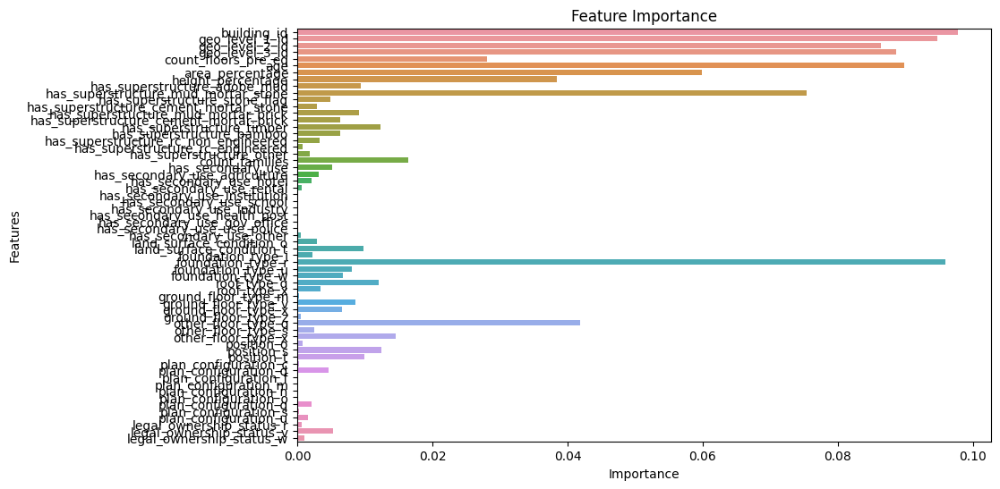

In [117]:
# Feature importance
feature_importance = rc_best.feature_importances_

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance, y=x.columns)
plt.title("Feature Importance")
plt.xlabel("Importance")
plt.ylabel("Features")
plt.show()

In [207]:
#Random Search sets up a grid of hyperparameter values and selects random combinations to train the model and score.
#This allows you to explicitly control the number of parameter combinations that are attempted.
#The number of search iterations is set based on time or resources.
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]#List Comprehension-using for loop in list
max_features = ['auto', 'sqrt']#maximum number of features allowed to try in individual tree
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]#List Comprehension-using for loop in list
max_depth.append(None)
min_samples_split = [2, 5, 10]#minimum number of samples required to split an internal node
min_samples_leaf = [1, 2, 4]#minimum number of samples required to be at a leaf node.
bootstrap = [True, False]#sampling 

#dictionary for hyperparameters
random_grid = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}

rf_clf1 = RandomForestClassifier(random_state=42)#model

rf_cv = RandomizedSearchCV(estimator=rf_clf1, scoring='f1',param_distributions=random_grid, n_iter=100, cv=3, 
                               verbose=2, random_state=42, n_jobs=-1)
#estimator--number of decision tree
#scoring--->performance matrix to check performance
#param_distribution-->hyperparametes(dictionary we created)
#n_iter--->Number of parameter settings that are sampled. n_iter trades off runtime vs quality of the solution.default=10
##cv------> number of flods
#verbose=Controls the verbosity: the higher, the more messages.
#n_jobs---->Number of jobs to run in parallel,-1 means using all processors.

rf_cv.fit(x_train, y_train)##training data on randomsearch cv
rf_best_params = rf_cv.best_params_##it will give you best parameters 
print(f"Best paramters: {rf_best_params})")##printing  best parameters
 


Fitting 3 folds for each of 100 candidates, totalling 300 fits


MemoryError: Unable to allocate 50.9 MiB for an array with shape (111194, 60) and data type float64

**Suggestions to the Seismologists to avoid  earthquake event leading  to significant damage in many buildings**

To reduce the likelihood of significant damage in buildings caused by earthquakes, seismologists could provide the following suggestions:

- Early Warning Systems: Develop and deploy robust early warning systems capable of detecting seismic activity and issuing timely alerts to at-risk populations. These systems can provide crucial seconds to minutes of advance notice, allowing people to take protective actions and evacuate buildings before the shaking begins.
- Public Education and Awareness: Launch extensive public education campaigns to raise awareness about earthquake preparedness and safety measures. Educate individuals, communities, and businesses on how to secure furniture, create evacuation plans, and assemble emergency kits containing essential supplies.
- Building Codes and Standards: Advocate for the enforcement of stringent building codes and standards that prioritize earthquake-resistant construction techniques and materials. Encourage retrofitting and reinforcement of existing buildings to enhance their resilience to seismic forces.
- Site-Specific Risk Assessments: Conduct thorough site-specific risk assessments to identify areas prone to liquefaction, landslides, and other secondary hazards triggered by earthquakes. Implement zoning regulations and land-use planning measures to restrict development in high-risk zones and protect critical infrastructure.
- Seismic Retrofitting: Promote the retrofitting of vulnerable structures, particularly schools, hospitals, and essential lifeline infrastructure, to improve their ability to withstand seismic shaking. Offer financial incentives and technical assistance programs to facilitate retrofitting efforts, especially in low-income and high-risk areas.
- Community Resilience Programs: Foster community resilience through capacity-building initiatives, such as community-based disaster preparedness training, neighborhood drills, and the establishment of community emergency response teams. Empower local residents to take proactive measures to safeguard their homes and neighborhoods.
- Infrastructure Lifelines: Strengthen the resilience of lifeline infrastructure systems, including water supply networks, power grids, transportation networks, and communication systems, to minimize disruption and facilitate rapid recovery following an earthquake. Incorporate redundancy, robustness, and post-earthquake recovery plans into infrastructure design and planning.
- International Collaboration: Foster collaboration and knowledge-sharing among seismologists, engineers, policymakers, and emergency responders at the national, regional, and international levels. Pool resources, expertise, and best practices to develop innovative solutions for earthquake risk reduction and resilience-building efforts.
- Research and Innovation: Invest in research and innovation to advance earthquake science, engineering, and technology. Support interdisciplinary research initiatives aimed at understanding earthquake processes, developing predictive models, and designing innovative mitigation strategies.
Continuous Monitoring and Evaluation: Establish a comprehensive monitoring and evaluation framework to assess the effectiveness of earthquake risk reduction measures over time. Monitor changes in seismic activity, building vulnerability, and community resilience indicators to inform adaptive management and policy decisions.